
===================================================================================================
# Test the hologram performances with HD160617 data 09 jun 2017
==================================================================================================

- author : Sylvie
- date   : October 2nd th 2017
- update : October 6th 2017


Inspired from Jeremy's work on PN and QSO

> This notebook start from images that has been deflated. So the task. is the following
> 1) Find the central star position
> 2) Find the rotation using the Hessian technique (from Jeremy)
> 3) Turn the images and cut
> 4) save for later analysis

The task of this notbook is organized in 3 sections.

- The Section 1 : deals with central star location. At the end of Section 1 sub-images containing the central star and the dispersed spectra are saved in fits file.
-> notice that important ascii file on first order position is save for later wavelength calibration   

- The section 2 : search the rotation angle of dispersed spectrum by applying an Hessian method. At the end of section 2, the rotated images are saves in fits file

- The section 3 was supposed to reconstruct spectra, but I prefer to reconstruct the spectra in another notbook. Indeed, selection critera are seet up in **Ana2DShapeSpectra** notebook.

Notice that when there is a large number of files open in input, the notebook may fail. So the section 1 and 2 may be run one after the other but in different jupyter notebook session because the intermediate files have been saved.
But some common initialisation at the top of this notebook is mandatory for each independant session 





TOO CROWDED FOV !!!!!!!!!!!!!!!!!!!


#### problem because limitation in output of data

- firt I tried to generate a config file for jupyter

If you ran jupyter notebook --generate-config to create it, it should be in the correct place already. If not, try putting it at ~/.jupyter/jupyter_notebook_config.py

- and I set : 
> c.NotebookApp.iopub_data_rate_limit = 1000000

but it failed again so I launch jupyter as follow:

> jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000 full_baseanalysis.ipynb 

So it behaves better


- however Jupyter notbook may not save the change !!!!!!!!

# Initialisation of the notebook

In [3]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [4]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
full_baseanalysis
ccdproc version 1.2.0
bottleneck version 1.2.1
/Users/dagoret/MacOSX/GitHub/LSST/CTIOAnaJun2017/ana_09jun17/HD160617


In [5]:
from astropy.modeling import models, fitting

In [6]:
import pandas as pd

## Input directory

- specify which are the input images

In [7]:
inputdir="/Users/dagoret/DATA/CTIODataJune2017_reducedRed/data_09jun17"
MIN_IMGNUMBER=31
MAX_IMGNUMBER=150
date="20170609"
object_name='HD160617'
tag = "reduc"
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

## Output directory

- specify where are stored the cut images as well as the plot produced

In [8]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

outputdir="./cut_fitsimages"
ensure_dir(outputdir)

## End of mandatory initialisation

-------------------------------------------------------
# Now  skip to the section to be re-run
-------------------------------------------------------


- Section 1: Find the central star and cut the image around the the dispersed spectrum
- Section 2 : find the dispersion axis angle of rotation wrt X-axis and apply the rotation
- Section 3 : Check with 1D spectrum

# Section 1 : Find the central star and cut the image around the the dispersed spectrum

## Read of the image spectra

In [9]:
dirlist_all = [inputdir] # only one directory to process
sorted_numbers,sorted_files = MakeFileList(dirlist_all,MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 37


## Sort the index according the disperser type



### tabulated disperser-filters

- in common_notebook

In [10]:
print Filt_names

['dia Ron400', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Ron200', 'Unknown']


### filter-disperser in our data

- check the filter names are inside Filt_names

In [11]:
print all_filt

['FGB37 Ron400', 'FGB37 Thor300', 'RG715 HoloPhP', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'FGB37 Ron400', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'FGB37 HoloAmAg', 'FGB37 Ron400', 'FGB37 Thor300', 'RG715 HoloPhP', 'FGB37 HoloPhAg', 'FGB37 Ron400', 'RG715 HoloPhP', 'RG715 Thor300', 'FGB37 HoloPhAg', 'RG715 HoloPhAg', 'FGB37 HoloAmAg', 'FGB37 Ron400', 'RG715 Ron400', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'FGB37 Thor300', 'RG715 Thor300', 'RG715 HoloPhP', 'FGB37 HoloPhAg', 'FGB37 HoloAmAg', 'RG715 Ron400', 'FGB37 HoloPhP', 'RG715 HoloPhAg', 'FGB37 Thor300', 'RG715 HoloPhAg']


###  Do the disperser sorting



In [12]:
filt0_idx,filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx,filt6_idx=get_filt_idx(all_filt)

 common_notebook::get_filt_idx unknown:  filter-disperser  FGB37 Ron400
 common_notebook::get_filt_idx unknown:  filter-disperser  FGB37 Thor300
 common_notebook::get_filt_idx unknown:  filter-disperser  RG715 HoloPhP
 common_notebook::get_filt_idx unknown:  filter-disperser  RG715 Thor300
 common_notebook::get_filt_idx unknown:  filter-disperser  RG715 HoloPhP
 common_notebook::get_filt_idx unknown:  filter-disperser  RG715 HoloPhAg
 common_notebook::get_filt_idx unknown:  filter-disperser  RG715 HoloAmAg
 common_notebook::get_filt_idx unknown:  filter-disperser  FGB37 Ron400
 common_notebook::get_filt_idx unknown:  filter-disperser  RG715 Ron400
 common_notebook::get_filt_idx unknown:  filter-disperser  RG715 Thor300
 common_notebook::get_filt_idx unknown:  filter-disperser  RG715 HoloPhP
 common_notebook::get_filt_idx unknown:  filter-disperser  FGB37 HoloAmAg
 common_notebook::get_filt_idx unknown:  filter-disperser  FGB37 Ron400
 common_notebook::get_filt_idx unknown:  filter-disp

### Check the sorting result

In [13]:
print 'filt0_idx :: ',filt0_idx
print 'filt1_idx :: ',filt1_idx
print 'filt2_idx :: ',filt2_idx
print 'filt3_idx :: ',filt3_idx
print 'filt4_idx :: ',filt4_idx
print 'filt5_idx :: ',filt5_idx
print 'filt6_idx :: ',filt5_idx

filt0_idx ::  []
filt1_idx ::  []
filt2_idx ::  []
filt3_idx ::  []
filt4_idx ::  []
filt5_idx ::  []
filt6_idx ::  []


## Example for one raw image


- the idea is to check where is the center of the main star
- size 2k x 2 K

In [14]:
# select the index
sel_index=1

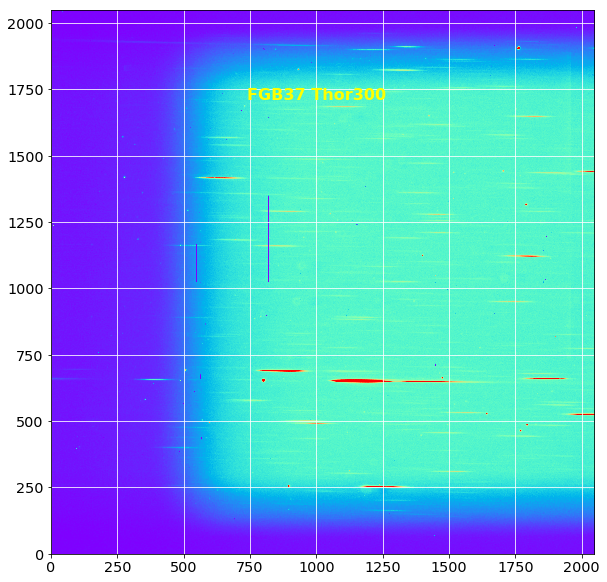

In [15]:
plt.figure(figsize=(10,10))
plt.imshow(all_images[sel_index],origin='lower',cmap='rainbow',vmin=0, vmax=2000)
plt.grid(color='white', ls='solid')
plt.text(1000.,1700,all_filt[sel_index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)

### Try to fit a 2D gaussian

- Fit a 2D gaussian on intensity of central star


we have to paly with the parameter below to find a common region to find the central star

In [16]:
# first rough estimate of the maximum
x0,y0=guess_init_fit(all_images[sel_index],500,1100,500,1100)

In [17]:
dw=200  # width

In [18]:
print "x0,y0=",x0,y0

x0,y0= 799 689


In [19]:
# cut the subimage
cropped_image=np.copy(all_images[sel_index][y0-dw:y0+dw,x0-dw:x0+dw])

In [20]:
NY=cropped_image.shape[0]
NX=cropped_image.shape[1]

In [21]:
# build a mesh grid of x-y
y, x = np.mgrid[:NY,:NX]

In [22]:
z=cropped_image[y,x]

### Show the pre-selected subimage

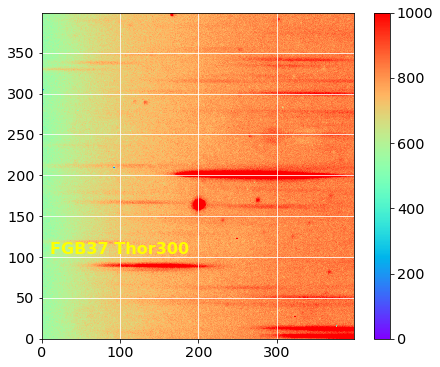

In [23]:
# plot x,y,z
plt.figure(figsize=(7,6))
plt.pcolormesh(x, y, z,cmap='rainbow',vmin=0, vmax=1000)
plt.grid(color='white', ls='solid')
plt.colorbar()
plt.text(100.,100,all_filt[sel_index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)

In [24]:
x_mean=NX/2
y_mean=NY/2
z_max=z[y_mean,x_mean]
print x_mean,y_mean,z_max

200 200 1791.27690621


### Make the 2D fit

In [25]:
p_init = models.Gaussian2D(amplitude=z_max,x_mean=x_mean,y_mean=y_mean)
fit_p = fitting.LevMarLSQFitter()

In [26]:
import warnings
p = fit_p(p_init, x, y, z)

In [27]:
print p.x_mean
print p.y_mean
print p.amplitude

Parameter('x_mean', value=327.746349254)
Parameter('y_mean', value=151.529095525)
Parameter('amplitude', value=880.154436035)


In [28]:
new_x0=p.x_mean
new_y0=p.y_mean

### Show result of 2D gaussian fit

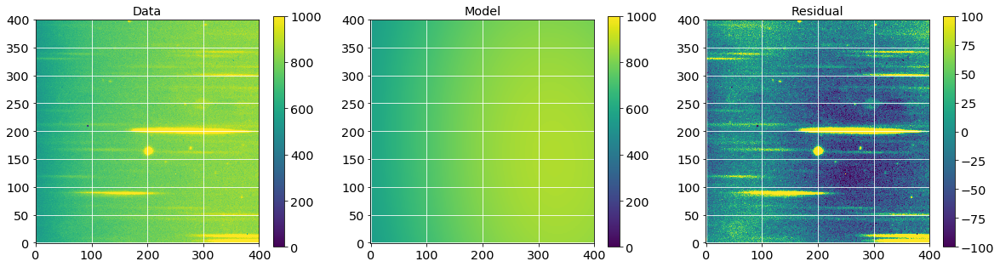

In [29]:
plt.figure(figsize=(20, 5))
#subplot 1
plt.subplot(1, 3, 1)
plt.imshow(z, origin='lower', interpolation='nearest', vmin=0, vmax=1000)
plt.grid(color='white', ls='solid')
plt.colorbar()
plt.title("Data")
#subplot 2
plt.subplot(1, 3, 2)
plt.imshow(p(x, y), origin='lower', interpolation='nearest', vmin=0,vmax=1000)
plt.grid(color='white', ls='solid')
plt.colorbar()
plt.title("Model")
#subplot 3
plt.subplot(1, 3, 3)
plt.imshow(z - p(x, y), origin='lower', interpolation='nearest', vmin=-100,vmax=100)
plt.grid(color='white', ls='solid')
plt.colorbar()
plt.title("Residual")

### Check the result of the fit

- the center of the star is where it is expected (black point)

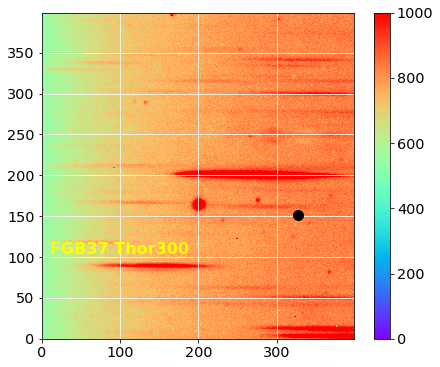

In [30]:
plt.figure(figsize=(7,6))
plt.pcolormesh(x, y, z,cmap='rainbow',vmin=0, vmax=1000)
plt.plot([new_x0],[new_y0],'ko',markersize=10)
plt.grid(color='white', ls='solid')
plt.colorbar()
plt.text(100.,100,all_filt[sel_index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)

## Show the images at Input

- So now work on the series of the images

- First look at them
- notice there is a downsampling factor of 10

Processing image 0...
Processing image 1...
Processing image 2...
Processing image 3...
Processing image 4...
Processing image 5...
Processing image 6...
Processing image 7...
Processing image 8...
Processing image 9...
Processing image 10...
Processing image 11...
Processing image 12...
Processing image 13...
Processing image 14...
Processing image 15...
Processing image 16...
Processing image 17...
Processing image 18...
Processing image 19...
Processing image 20...
Processing image 21...
Processing image 22...
Processing image 23...
Processing image 24...
Processing image 25...
Processing image 26...
Processing image 27...
Processing image 28...
Processing image 29...
Processing image 30...
Processing image 31...
Processing image 32...
Processing image 33...
Processing image 34...
Processing image 35...
Processing image 36...


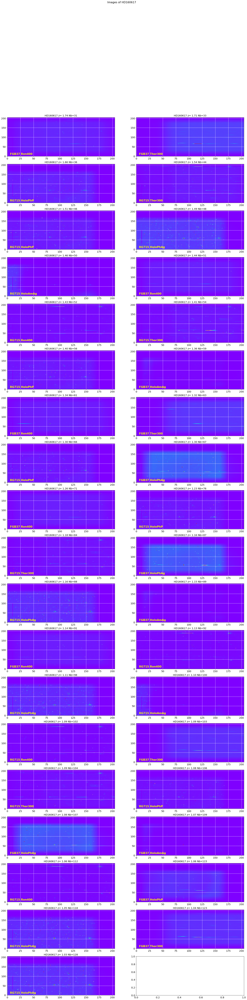

In [31]:
ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000,downsampling=10,verbose=True)

figfilename=os.path.join(dir_top_images,'input_images.pdf')
plt.savefig(figfilename)   

## Show the histograms of input images

- just check the reduction and deflattage is OK

Processing image 0...
Processing image 1...
Processing image 2...
Processing image 3...
Processing image 4...
Processing image 5...
Processing image 6...
Processing image 7...
Processing image 8...
Processing image 9...
Processing image 10...
Processing image 11...
Processing image 12...
Processing image 13...
Processing image 14...
Processing image 15...
Processing image 16...
Processing image 17...
Processing image 18...
Processing image 19...
Processing image 20...
Processing image 21...
Processing image 22...
Processing image 23...
Processing image 24...
Processing image 25...
Processing image 26...
Processing image 27...
Processing image 28...
Processing image 29...
Processing image 30...
Processing image 31...
Processing image 32...
Processing image 33...
Processing image 34...
Processing image 35...
Processing image 36...


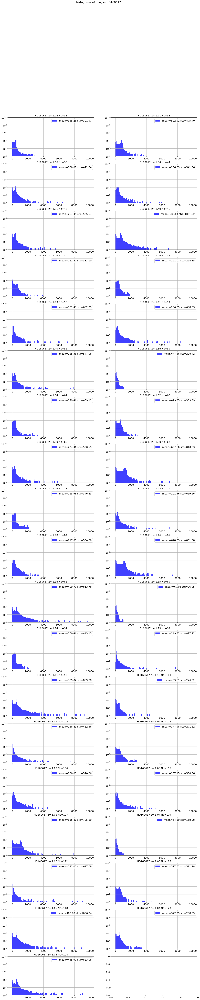

In [32]:
ShowHistograms(all_images,all_titles,all_filt,object_name,
               NBIMGPERROW=2,bins=100,range=(-50,10000),downsampling=10,verbose=True)

##  Guess central position of the central star in original image

- defines two utility functions


### Compute the position of central star

In [33]:
# guess the region where the maximum is
Delta_x0=[500,1100]
Delta_y0=[500,1100]
dwc=200

x_guess,y_guess=guess_central_position(all_images,Delta_x0,Delta_y0,dwc,filt0_idx,filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx)

0 : (x_guess,y_guess)= 798.324530843 652.41913613
1 : (x_guess,y_guess)= 926.746349254 640.529095525
2 : (x_guess,y_guess)= 801.276588965 652.886256473
3 : (x_guess,y_guess)= 806.995290365 651.374729578
4 : (x_guess,y_guess)= 807.712798464 649.084361445
5 : (x_guess,y_guess)= 899.17588315 589.479269454
6 : (x_guess,y_guess)= 900.828248019 586.366023407
7 : (x_guess,y_guess)= 810.542849137 644.522929363
8 : (x_guess,y_guess)= 810.007940459 644.897950062
9 : (x_guess,y_guess)= 809.719508223 645.769111186
10 : (x_guess,y_guess)= 811.747105151 643.688102554
11 : (x_guess,y_guess)= 901.123607767 580.208511314
12 : (x_guess,y_guess)= 811.36301193 637.761477189
13 : (x_guess,y_guess)= 936.1872392 627.5307555
14 : (x_guess,y_guess)= 810.872140736 637.192459878
15 : (x_guess,y_guess)= 902.403373507 576.082475213
16 : (x_guess,y_guess)= 811.694216061 631.074850698
17 : (x_guess,y_guess)= 814.278745552 631.533116851
18 : (x_guess,y_guess)= 813.806879743 627.723726632
19 : (x_guess,y_guess)= 901.1

/Users/dagoret/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


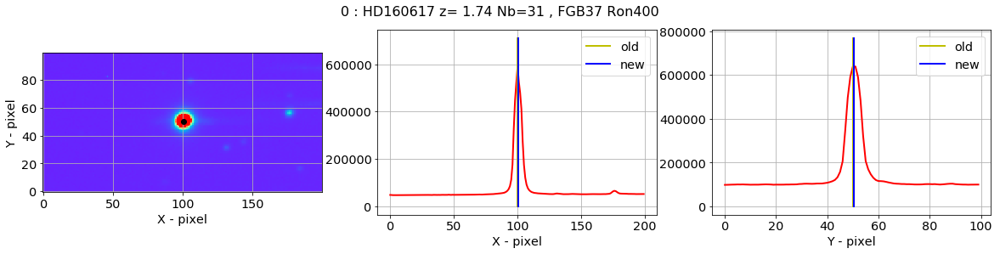

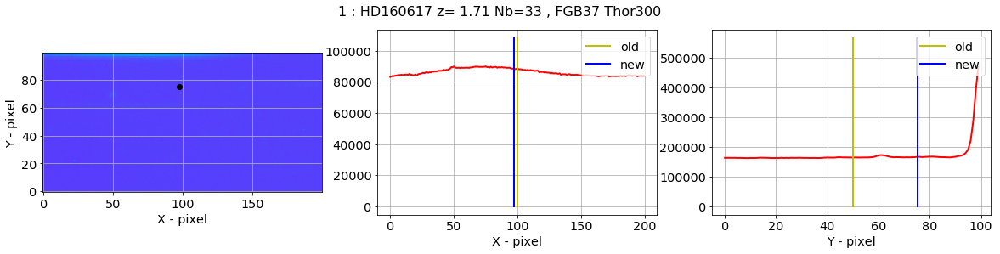

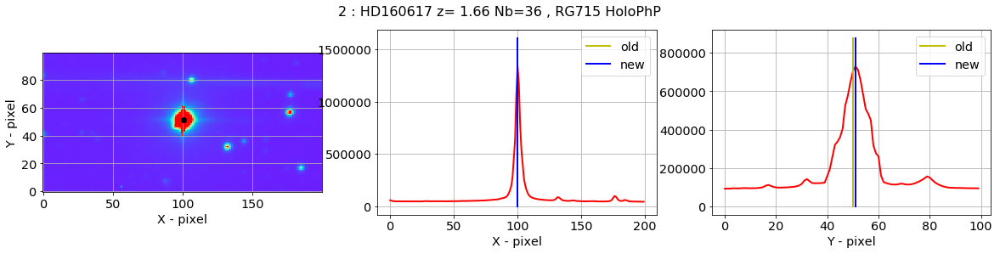

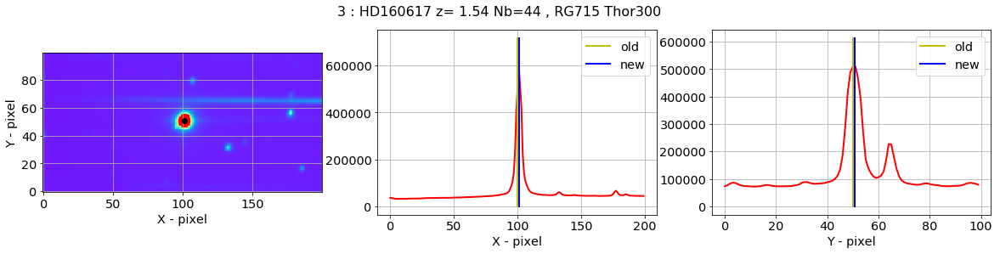

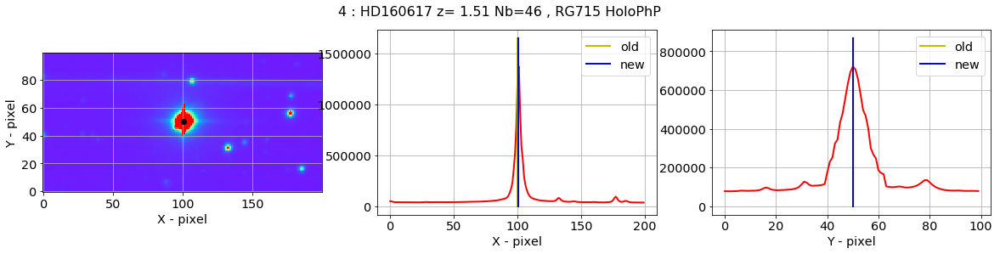

...

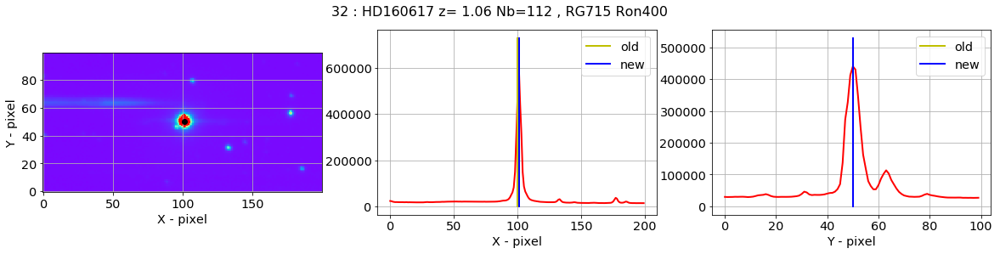

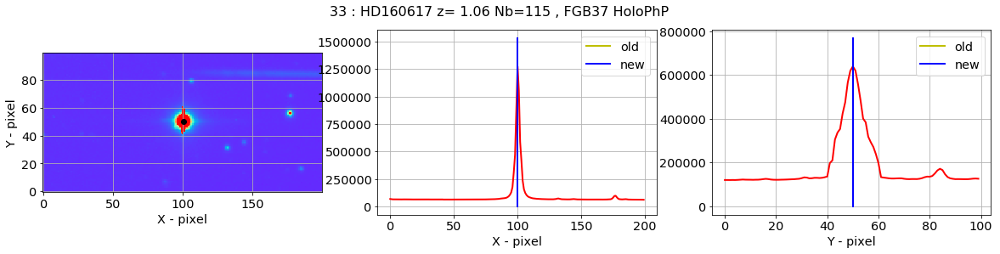

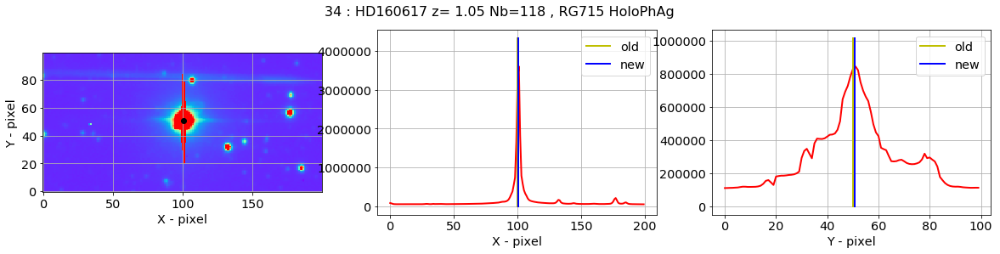

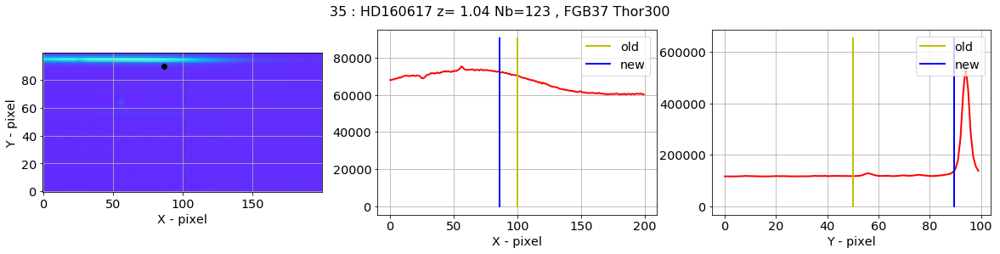

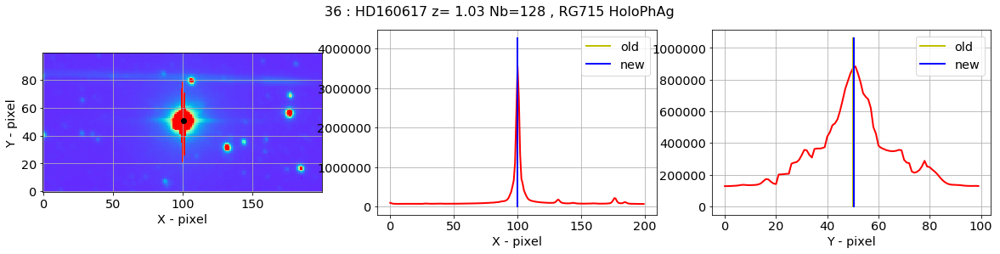

In [34]:
new_x_guess,new_y_guess=check_central_star(all_images,x_guess,y_guess,all_titles,all_filt,Dx=100,Dy=50)

### Check corrections of the center

In [35]:
dx_guess=new_x_guess-x_guess
dy_guess=new_y_guess-y_guess

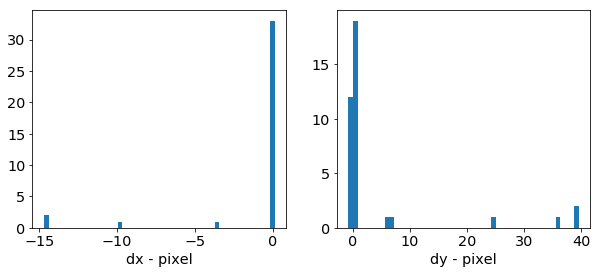

In [36]:
f, (ax1, ax2) = plt.subplots(1,2, figsize=(10,4))
ax1.hist(dx_guess,bins=50);
ax1.set_xlabel("dx - pixel")
ax2.hist(dy_guess,bins=50);
ax2.set_xlabel("dy - pixel")

In [37]:
x_guess=new_x_guess
y_guess=new_y_guess

## Save x_guess, y_guess in a file

In [38]:
ar = {'x_guess' : x_guess, 'y_guess' : y_guess}
df = pd.DataFrame(ar)

In [39]:
df.head()

,x_guess,y_guess
0,798.278768,652.456534
1,923.059152,665.394540
2,801.180310,653.160411
3,807.096876,651.738062
4,807.670996,649.206066


In [40]:
df.tail()

,x_guess,y_guess
32,801.959113,610.110799
33,800.192598,607.140142
34,890.606839,547.775145
35,905.158040,636.694290
36,891.112672,545.492008


In [41]:
df.describe()

,x_guess,y_guess
count,37.000000,37.000000
mean,850.927667,611.376863
std,48.164164,37.853173
min,798.278768,545.492008
25%,808.235570,576.325505
50%,813.860423,620.166323
75%,899.488961,644.592096
max,926.335121,665.394540


In [42]:
df.to_csv('x_y_guess.csv')

## Finally cut image

- before rotation

- cut the image around the spectra
- the width in Y is DeltaY=100 pixel above and down

In [43]:
DeltaY=[100]*len(all_images)
DeltaX=[2000]*len(all_images)  # must be very large to have correct x positions

images_raw=ShowCenterImages(x_guess,y_guess,DeltaX,DeltaY,all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=2000,target_pos=np.array([x_guess,y_guess]).T)
figfilename=os.path.join(dir_top_images,'cut_images.pdf')
plt.savefig(figfilename)   

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


## Save cut images
------------------------

- save the series of cut images called **images_raw** in a file


In [44]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[-1]
    short_partfilename=re.findall('^%s_(.*)' % tag,short_infilename)
    short_outfilename='cutimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)
    
for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_raw[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,overwrite=True)

!ls -l cut_fitsimages/*

-rw-r--r--  1 dagoret  LAL\Utilisateurs du domaine  3288960 Oct  6 14:57 cut_fitsimages/cutimg_20170609_031.fits
-rw-r--r--  1 dagoret  LAL\Utilisateurs du domaine  3288960 Oct  6 14:57 cut_fitsimages/cutimg_20170609_033.fits
-rw-r--r--  1 dagoret  LAL\Utilisateurs du domaine  3288960 Oct  6 14:57 cut_fitsimages/cutimg_20170609_036.fits
-rw-r--r--  1 dagoret  LAL\Utilisateurs du domaine  3288960 Oct  6 14:57 cut_fitsimages/cutimg_20170609_044.fits
-rw-r--r--  1 dagoret  LAL\Utilisateurs du domaine  3288960 Oct  6 14:57 cut_fitsimages/cutimg_20170609_046.fits
-rw-r--r--  1 dagoret  LAL\Utilisateurs du domaine  3288960 Oct  6 14:57 cut_fitsimages/cutimg_20170609_048.fits
-rw-r--r--  1 dagoret  LAL\Utilisateurs du domaine  3288960 Oct  6 14:57 cut_fitsimages/cutimg_20170609_050.fits
-rw-r--r--  1 dagoret  LAL\Utilisateurs du domaine  3288960 Oct  6 14:57 cut_fitsimages/cutimg_20170609_051.fits
-rw-r--r--  1 dagoret  LAL\Utilisateurs du domaine  3288960 Oct  6 14:57 cut_fitsimages/cutimg_2

---------------------------------------------------------------------------------
# Section 2 : Find the rotation angle and apply rotation
----------------------------------------------------------------------------------

## Initialisation of Section 2
----------------------------------

In [45]:
inputdir="./cut_fitsimages"
SelectTagRe='^cutimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^cutimg_%s_[0-9]+.fits$' % date

outputdir="./rotated_fitsimages"
ensure_dir(outputdir)

sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 37


In [46]:
filt0_idx,filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx,filt6_idx=get_filt_idx(all_filt)

 common_notebook::get_filt_idx unknown:  filter-disperser  FGB37 Ron400
 common_notebook::get_filt_idx unknown:  filter-disperser  FGB37 Thor300
 common_notebook::get_filt_idx unknown:  filter-disperser  RG715 HoloPhP
 common_notebook::get_filt_idx unknown:  filter-disperser  RG715 Thor300
 common_notebook::get_filt_idx unknown:  filter-disperser  RG715 HoloPhP
 common_notebook::get_filt_idx unknown:  filter-disperser  RG715 HoloPhAg
 common_notebook::get_filt_idx unknown:  filter-disperser  RG715 HoloAmAg
 common_notebook::get_filt_idx unknown:  filter-disperser  FGB37 Ron400
 common_notebook::get_filt_idx unknown:  filter-disperser  RG715 Ron400
 common_notebook::get_filt_idx unknown:  filter-disperser  RG715 Thor300
 common_notebook::get_filt_idx unknown:  filter-disperser  RG715 HoloPhP
 common_notebook::get_filt_idx unknown:  filter-disperser  FGB37 HoloAmAg
 common_notebook::get_filt_idx unknown:  filter-disperser  FGB37 Ron400
 common_notebook::get_filt_idx unknown:  filter-disp

In [47]:
df=pd.read_csv('x_y_guess.csv')
x_guess=df["x_guess"]
y_guess=df["y_guess"]
DeltaY=[100]*len(all_images)

In [48]:
df.head()

,Unnamed: 0,x_guess,y_guess
0,0,798.278768,652.456534
1,1,923.059152,665.394540
2,2,801.180310,653.160411
3,3,807.096876,651.738062
4,4,807.670996,649.206066


## Find rotation by Hessian analysis

La méthode s'inspire des techniques de détection de filmanents dans le milieu interstellaire.
Elle est décrite dans https://arxiv.org/pdf/1409.6728.pdf section 4.1.
Documentation sur le calcul du Hessien : http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.hessian_matrix

### Test rotation optimal settings

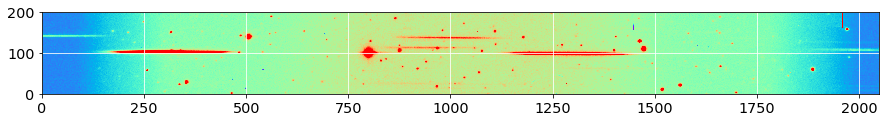

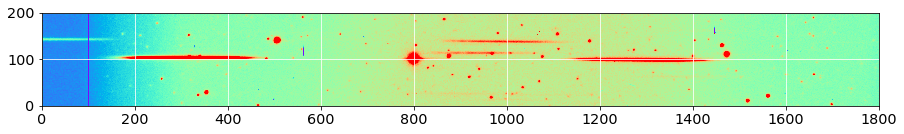

In [49]:
sel=0
image_sel=np.copy(all_images[sel])
y0=DeltaY[sel]
x0=x_guess[sel]

width_cut = 100
right_edge = 1800

plt.imshow(image_sel,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

region=np.copy(image_sel[y0-width_cut:y0+width_cut,0:right_edge])
data=np.copy(region)
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

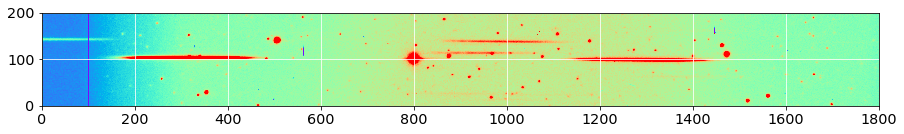

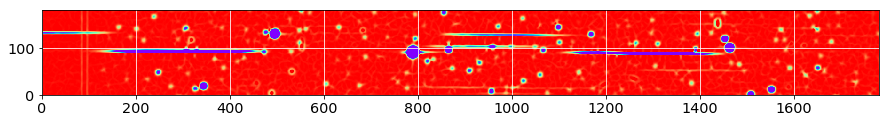

In [50]:
# le paramètre sigma permet de lisser le hessien
Hxx, Hxy, Hyy = hessian_matrix(data, sigma=3, order = 'xy')
lambda_plus = 0.5*( (Hxx+Hyy) + np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
lambda_minus = 0.5*( (Hxx+Hyy) - np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
theta = 0.5*np.arctan2(2*Hxy,Hyy-Hxx)*180/np.pi

margin_cut = 10

lambda_minus = lambda_minus[margin_cut:-margin_cut,margin_cut:-margin_cut]
lambda_plus = lambda_plus[margin_cut:-margin_cut,margin_cut:-margin_cut]
theta = theta[margin_cut:-margin_cut,margin_cut:-margin_cut]

plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()
plt.imshow(lambda_minus,origin='lower',cmap='rainbow',vmin=-10,vmax=0)
plt.grid(color='white', ls='solid')
plt.show()

Number of remaining pixels : 18405


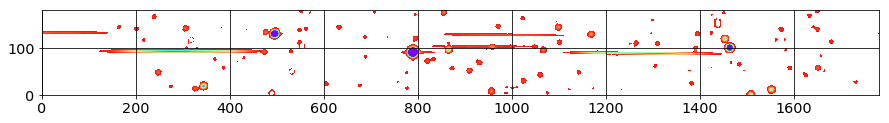

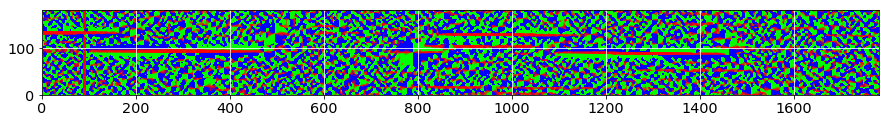

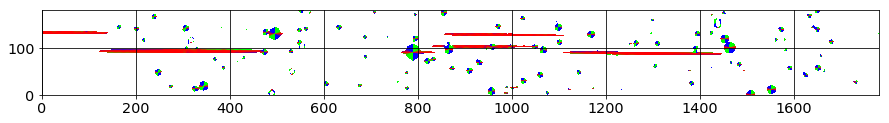

In [51]:
lambda_threshold = -2

mask = np.where(lambda_minus>lambda_threshold)
lambda_mask = np.copy(lambda_minus)
lambda_mask[mask]=np.nan

theta_mask = np.copy(theta)
theta_mask[mask]=np.nan

print 'Number of remaining pixels :',len(lambda_mask[~np.isnan(lambda_mask)])

plt.imshow(lambda_mask,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='black', ls='solid')
plt.show()

plt.imshow(theta,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='white', ls='solid')
plt.show()

plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='black', ls='solid')
plt.show()

Number of remaining pixels : 10300


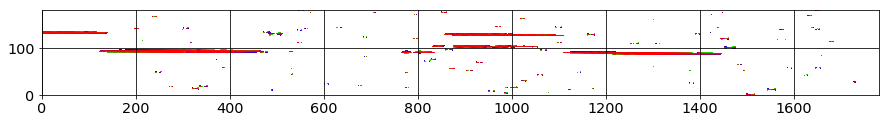

In [52]:
deg_threshold = 20

mask2 = np.where(np.abs(theta)>deg_threshold)
theta_mask[mask2] = np.nan
print 'Number of remaining pixels :',len(theta_mask[~np.isnan(theta_mask)])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.grid(color='black', ls='solid')
plt.show()

Angle median : -0.313128157531


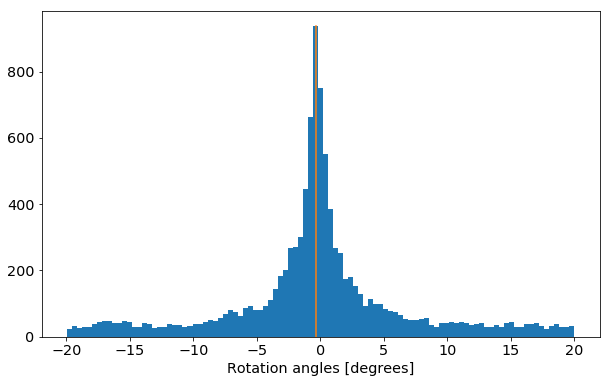

In [53]:
theta_hist = []
theta_hist = theta_mask[~np.isnan(theta_mask)].flatten()
theta_median = np.median(theta_hist)
print 'Angle median :',theta_median
fig = plt.figure(figsize=(10,6))
n,bins, patches = plt.hist(theta_hist,bins=int(np.sqrt(len(theta_hist))))
plt.plot([theta_median,theta_median],[0,np.max(n)])
plt.xlabel("Rotation angles [degrees]")
plt.show()

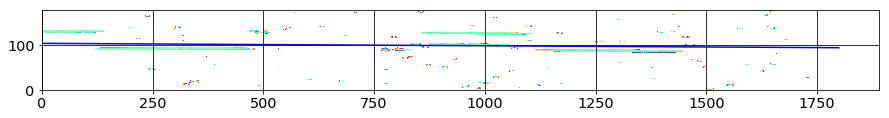

In [54]:
xindex=np.arange(data.shape[1])
x_new = np.linspace(xindex.min(),xindex.max(), 50)
#y_new = y0 - width_cut + (x_new-x0)*np.tan(theta_median*np.pi/180.)
# really want to see of hessian an straight line math SDC : Sept 25 2017
y_new = y0   + (x_new-x0)*np.tan(theta_median*np.pi/180.)
plt.imshow(theta_mask,origin='lower',cmap='rainbow',vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()


Rotation angle from fit : -0.602337746354


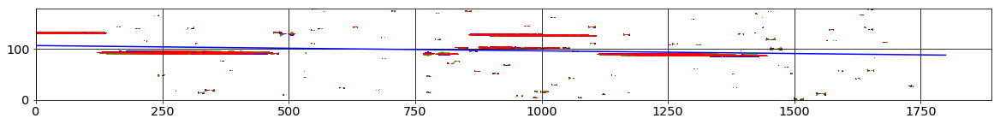

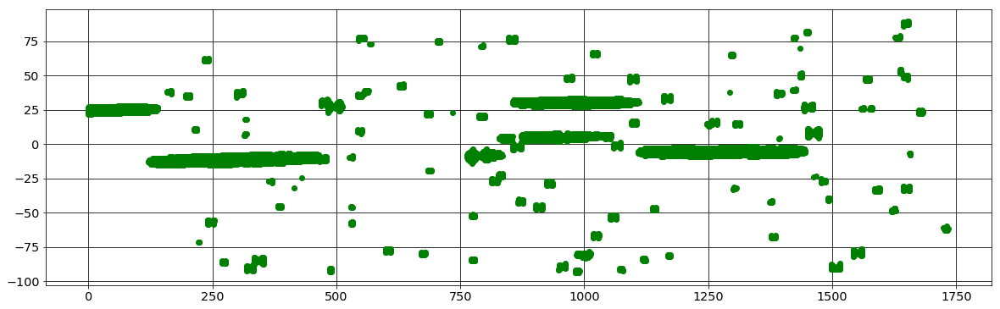

In [55]:
xtofit=[]
ytofit=[]
for iy,y in enumerate(theta_mask):
    for ix,x in enumerate(y):
        if not np.isnan(theta_mask[iy][ix]) :
            if np.abs(theta_mask[iy][ix])>deg_threshold : continue
            xtofit.append(ix)
            ytofit.append(iy)
popt, pcov = fit_line(xtofit, ytofit)
[a, b] = popt
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = line(x_new,a,b)
print 'Rotation angle from fit :',np.arctan(a)*180/np.pi
fig = plt.figure(figsize=[20,6])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()
fig = plt.figure(figsize=[20,6])
diff = []
for ix,x in enumerate(xtofit):
    diff.append(ytofit[ix]-line(x,a,b))
plt.plot(xtofit,diff,'go')
plt.grid(color='black', ls='solid')
plt.show()

Using Hessian theta angles:
0  theta =  -0.288167021233
1  theta =  -0.625074263067
2  theta =  -0.88396145643
3  theta =  -0.661874774577
4  theta =  -0.883891854065
5  theta =  -1.33128565152
6  theta =  -1.00355642433
7  theta =  -0.234855021149
8  theta =  -0.174436764361
9  theta =  -0.638793715307
10  theta =  -0.871479264755
11  theta =  -1.38020113854
12  theta =  -0.227777448968
13  theta =  -0.390805693075
14  theta =  -0.817897568461
15  theta =  -1.83299192929
16  theta =  -0.307604694465
17  theta =  -0.925955379825
18  theta =  -0.607399555555
19  theta =  -1.83340040627
20  theta =  -1.22143123001
21  theta =  -1.45059700279
22  theta =  -0.291481474296
23  theta =  -0.145968581935
24  theta =  -1.29921238643
25  theta =  -1.06705258875
26  theta =  -0.104186444916
27  theta =  -0.416671462283
28  theta =  -0.629591532839
29  theta =  -0.809507664313
30  theta =  -1.87978596468
31  theta =  -1.52867039838
32  theta =  -0.104712245548
33  theta =  -0.898002285149
34  thet

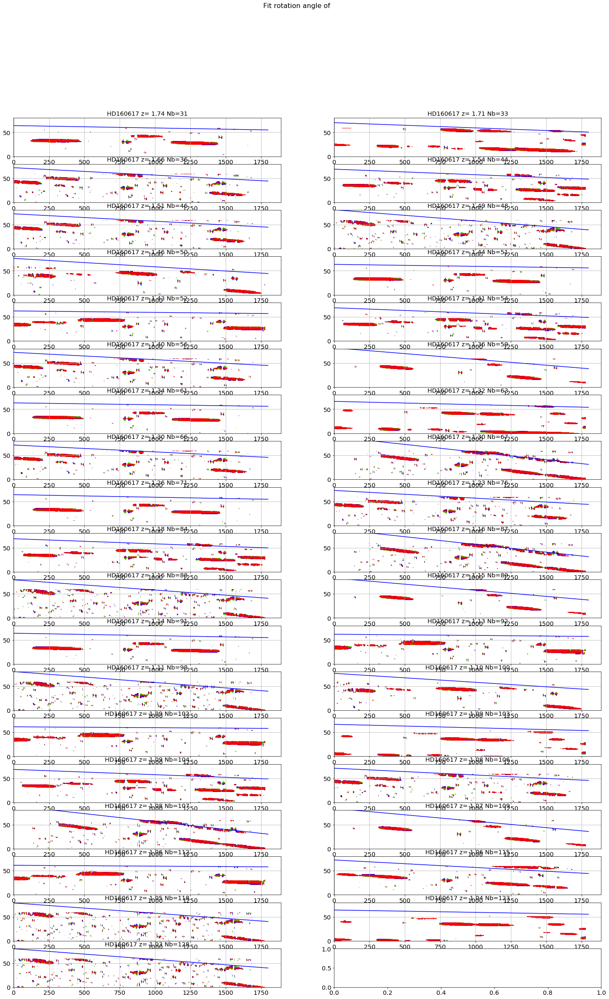

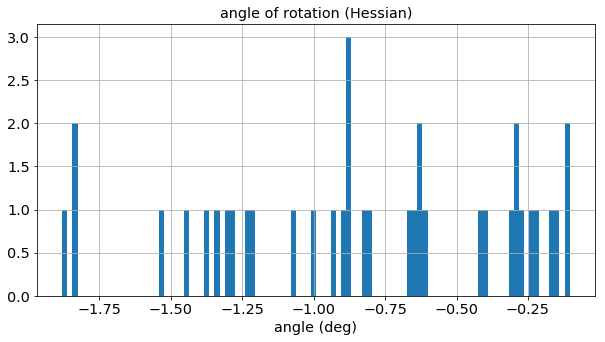

In [56]:
print 'Using Hessian theta angles:'

all_theta=ComputeRotationAngleHessian(all_images,x_guess,DeltaY,all_titles,object_name, 
    NBIMGPERROW=2, lambda_threshold = -2, deg_threshold = 20, width_cut = 40, right_edge = 1800, margin_cut = 10)
figfilename=os.path.join(dir_top_images,'fit_rotation.pdf')
plt.savefig(figfilename)  

for index in range(len(all_theta)):
    print index,' theta = ',all_theta[index]
plt.figure(figsize=(10,5))
n, bins, patches=plt.hist(all_theta,bins=100,histtype='stepfilled')
plt.grid(True)
plt.title('angle of rotation (Hessian)')
plt.xlabel('angle (deg)')

## Turn the images accordingly

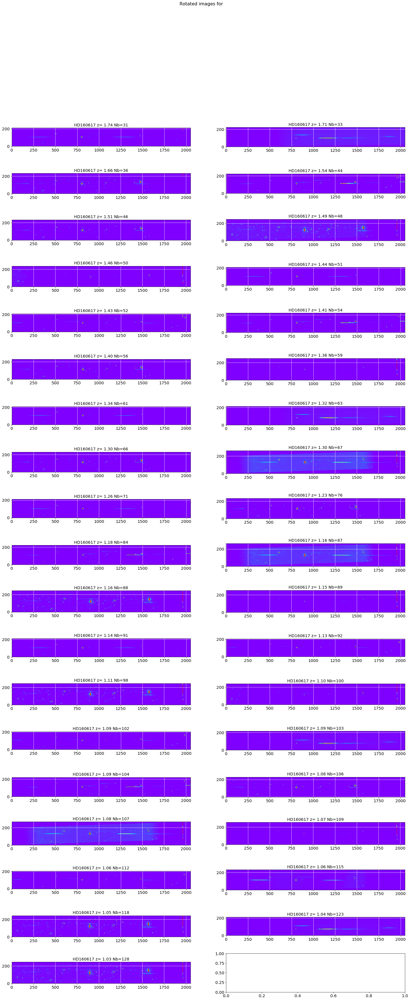

In [57]:
turned_images=TurnTheImages(all_images,all_theta,all_titles,object_name,
                            NBIMGPERROW=2,vmin=500,vmax=10000,oversample_factor=1)
figfilename=os.path.join(dir_top_images,'rotated_images.pdf')
plt.savefig(figfilename)  

## Check rotations

array([-0.04355841,  0.06364703, -0.08707991, -0.0318391 , -0.18788589,
       -0.38398687,  0.08915286, -0.06412435,  0.01061154, -0.03015972,
       -0.18710455,  0.05760391, -0.04770455, -0.08427956, -0.18117867,
       -0.15783237,  0.02419249, -0.15622202, -0.05370723, -0.11562836,
       -0.31684578,  0.02424095,  0.00916363,  0.04787853, -0.34972821,
        0.1141296 ,  0.00363271,  0.03243823, -0.04870879, -0.18336235,
       -0.07924109,  0.08892032,  0.0285137 , -0.08690084, -0.39346932,
       -0.02425394, -0.50055332])

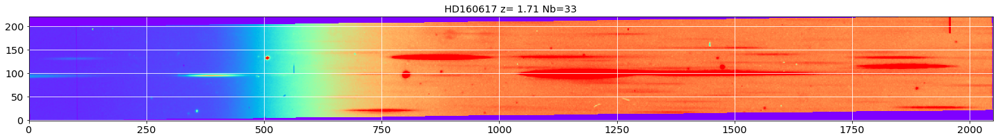

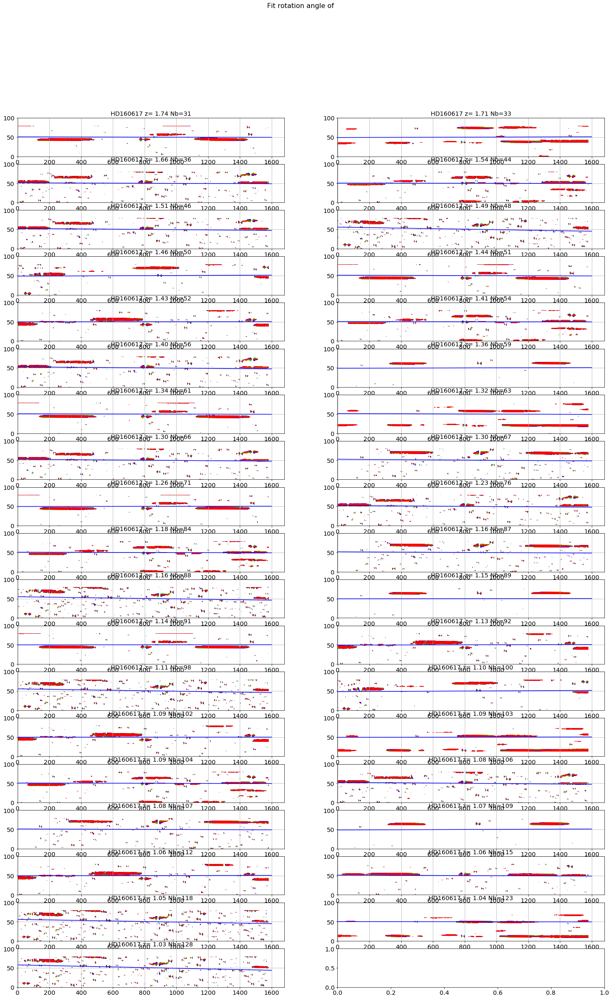

In [58]:
sel=1
plt.figure(figsize=(25,10))
plt.imshow(turned_images[sel],origin='lower',cmap='rainbow',vmin=0,vmax=1000)
plt.grid(True)
plt.title(all_titles[sel])
plt.grid(color='white', ls='solid')
figfilename=os.path.join(dir_top_images,'rotated_image_sample.pdf')
plt.savefig(figfilename)  

ComputeRotationAngleHessian(turned_images,x_guess,DeltaY,all_titles,object_name,
    NBIMGPERROW=2, lambda_threshold = -2, deg_threshold = 20, width_cut = 50, right_edge = 1600, margin_cut = 10)

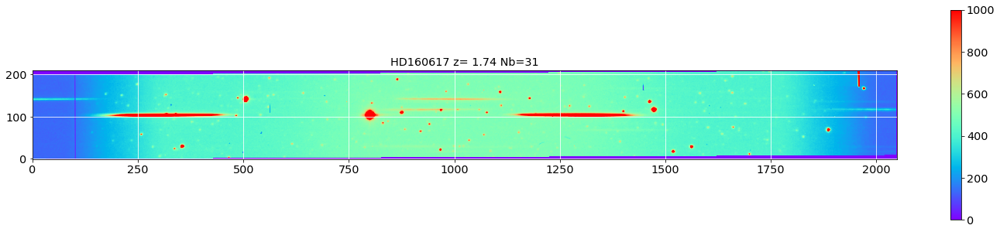

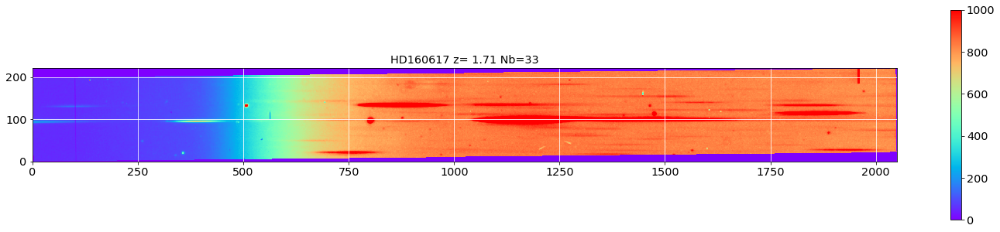

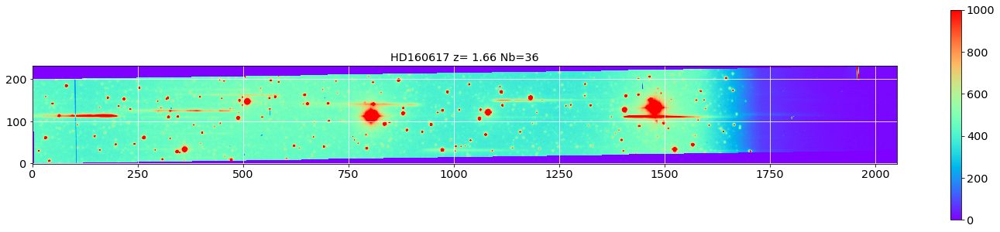

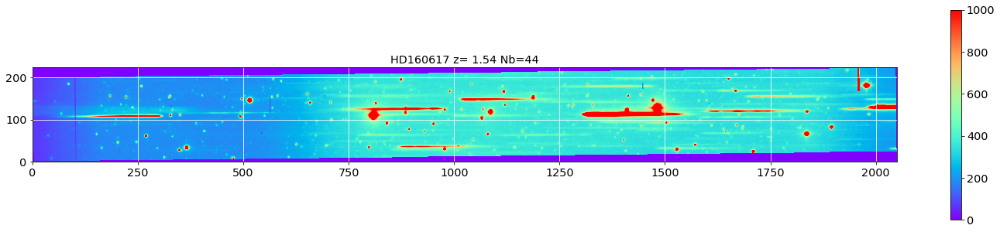

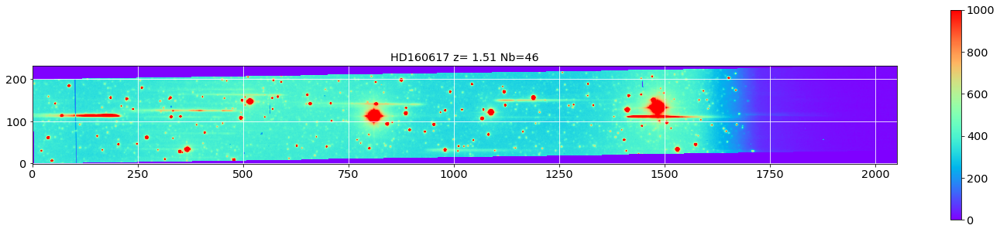

...

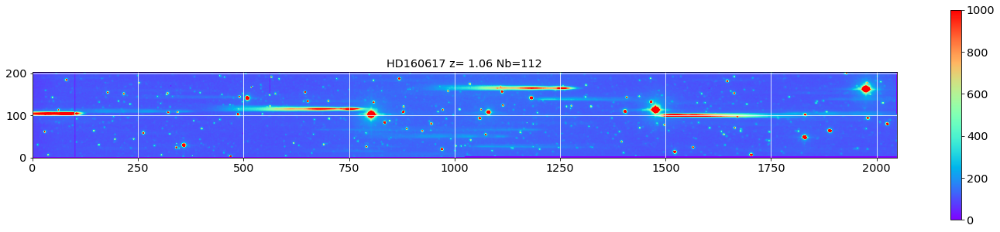

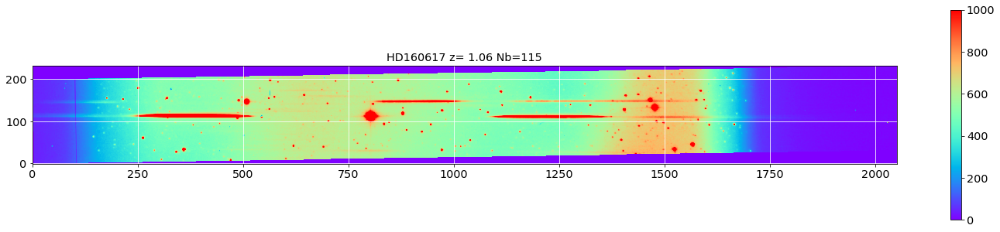

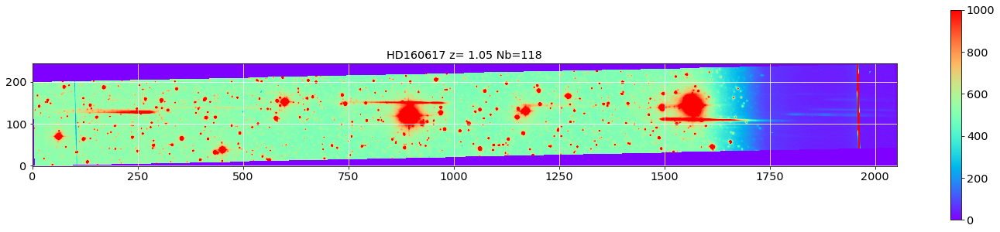

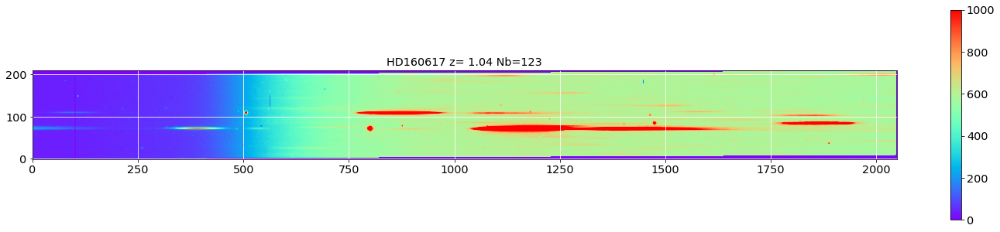

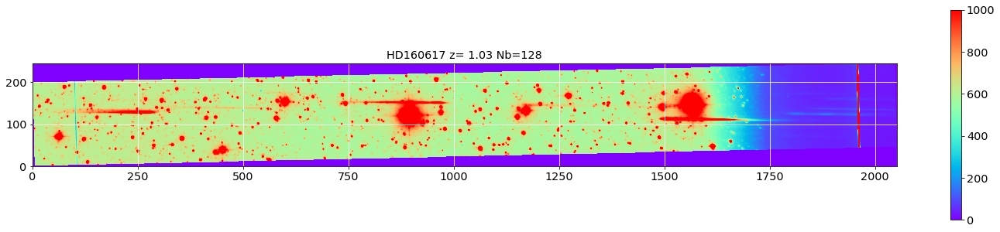

In [59]:
debug=True
if debug:
    for sel in range(len(turned_images)):
        plt.figure(figsize=(25,5))
        plt.imshow(turned_images[sel],origin='lower',cmap='rainbow',vmin=0,vmax=1000)
        plt.grid(True)
        plt.title(all_titles[sel])
        plt.grid(color='white', ls='solid')
        plt.colorbar()

## Must guess again the new centers for rotation

In [60]:
# guess the region where the maximum is
Delta_x02=[500,1100]
Delta_y02=[50,150]
dwc2=40

In [61]:
turned_images[0].shape

(210, 2049)

In [62]:
guess_init_fit(turned_images[0],Delta_x02[0],Delta_x02[1],Delta_y02[0],Delta_y02[1])

(799, 104)

### Initial guess

In [63]:
x_guess2,y_guess2=guess_central_position(turned_images,Delta_x02,Delta_y02,dwc2,filt0_idx,filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx)

0 : (x_guess,y_guess)= 798.828866754 104.287298527
1 : (x_guess,y_guess)= 721.564769504 -1285.35646789
2 : (x_guess,y_guess)= 802.802651151 112.461165448
3 : (x_guess,y_guess)= 807.999473782 109.869678271
4 : (x_guess,y_guess)= 809.231961068 112.752009377
5 : (x_guess,y_guess)= 901.187150013 121.542026372
6 : (x_guess,y_guess)= 902.429240756 110.216052169
7 : (x_guess,y_guess)= 811.045920993 103.65190212
8 : (x_guess,y_guess)= 810.51160891 102.252717014
9 : (x_guess,y_guess)= 810.731850707 108.886454229


10 : (x_guess,y_guess)= 813.270594025 111.974520922
11 : (x_guess,y_guess)= 903.148495388 121.765004287
12 : (x_guess,y_guess)= 811.863466722 103.917357057
13 : (x_guess,y_guess)= 710.255623981 -1212.74216137
14 : (x_guess,y_guess)= 812.385145389 111.663504647
15 : (x_guess,y_guess)= 904.950879663 128.725380258
16 : (x_guess,y_guess)= 812.198593234 104.43874753
17 : (x_guess,y_guess)= 815.785829856 113.609965197
18 : (x_guess,y_guess)= 814.812629436 108.501607183
19 : (x_guess,y_guess)= 903.699865243 128.791567487
20 : (x_guess,y_guess)= 903.60522899 119.578612876
21 : (x_guess,y_guess)= 901.503106371 123.531845968
22 : (x_guess,y_guess)= 808.812864147 103.983532008
23 : (x_guess,y_guess)= 809.099808769 102.457347932
24 : (x_guess,y_guess)= 899.581482521 121.761997022
25 : (x_guess,y_guess)= 896.341022103 111.369299855
26 : (x_guess,y_guess)= 805.722210267 102.656004057
27 : (x_guess,y_guess)= 672.161901734 -1117.42744366
28 : (x_guess,y_guess)= 806.761578056 108.476268953
29 : (x_gues

### Check new guess of turned images

ValueError: zero-size array to reduction operation maximum which has no identity

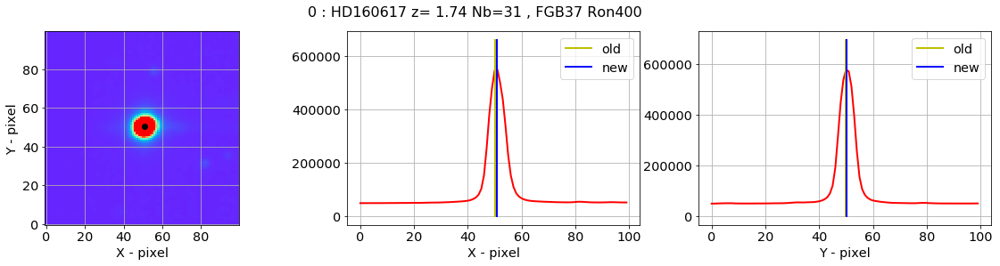

In [64]:
new_x_guess2,new_y_guess2=check_central_star(turned_images,x_guess2,y_guess2,all_titles,all_filt,Dx=50,Dy=50)

In [ ]:
x_guess2=new_x_guess2
y_guess2=new_y_guess2

In [ ]:
ar2 = {'x_guess2' :x_guess2, 'y_guess2' : y_guess2,'theta' :all_theta}
df2 = pd.DataFrame(ar2)

In [ ]:
df2.head()

In [ ]:
df2.to_csv('x_y_guess2.csv')

In [ ]:
DeltaX=[2000]*len(all_images)
DeltaY_rot2 = [50]*len(all_images) # change from 20 to 50 to see well the central star
x_guess_rot2 = x_guess2
y_guess_rot2 = y_guess2
images_cut_rot=ShowCenterImages(x_guess_rot2,y_guess_rot2,DeltaX,DeltaY_rot2,
                    turned_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000,target_pos=np.array([x_guess2,y_guess2]).T) 

## Find the central star locations
======================================

### Central star positions after rotation and cut

In [ ]:
# Not necessary to do this because already done
CompareBeforeAfterRotFlag=False

if CompareBeforeAfterRotFlag:

    x_guess_rot = x_guess2
    y_guess_rot = y_guess2
    DeltaY_rot = [100]*len(all_images)
    DeltaX_rot = [100]*len(all_images)
    # First stage : show the rotated images which were cut
    print 'First stage : show the rotated images which were cut'
    #--------------------------------------------------------------
    images_cut=ShowCenterImages(x_guess_rot,y_guess_rot,DeltaX_rot,DeltaY_rot,
                    images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000,target_pos=np.array([x_guess2,y_guess2]).T) 
    # Second stage : show the images cut before they were cut
    print 'Second stage : show the images cut before they were cut'
    #----------------------------------------------------------------
    images_cut_before_rot=ShowCenterImages(x_guess,[100]*len(all_images),DeltaX_rot,DeltaY_rot,
                    all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000,target_pos=np.array([x_guess,y_guess]).T) 

In [ ]:
# DAOFind does not work for me (never)
DAOFindUseFlag=False
    
# (JN) valeurs optimisées pour cette étude
if DAOFindUseFlag:
    img_mean,img_median,img_std,img_sources=ComputeStatImages(images_cut,fwhm=10,threshold=10,sigma=5.0,iters=5)
    print 'total number of images',len(images_cut)
    print 'number of centroid found ',len(img_sources)

## Central star position

- should take the brightest

In [ ]:
if DAOFindUseFlag:
    x_star = []
    y_star = []
    for index,s in enumerate(img_sources):
        for ss in s:
            x_star.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
            y_star.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])
        
    x_mean = np.mean(x_star)
    y_mean = np.mean(y_star)
    img_size=all_images[0].shape
    plt.figure(figsize=(5,5))

    # plot individual image center
    plt.plot(x_star,y_star,'o')
    # plot the average postion
    plt.plot(x_mean,y_mean,'ro')
    plt.xlim(0,img_size[1])
    plt.ylim(0,img_size[0])
    plt.grid(True)
    
    print 'nuber of x_star = ',len(x_star)
    print 'nuber of y_star = ',len(y_star)

> The problem is that DAOFIND may not find a center for each source. Thys the only solution
is to do the same thing : computing the average depending on each filter.

In [ ]:
if DAOFindUseFlag:
    x_star = []
    y_star = []

    x_star_f0 = []
    y_star_f0 = []

    x_star_f1 = []
    y_star_f1 = []

    x_star_f2 = []
    y_star_f2 = []

    x_star_f3 = []
    y_star_f3 = []

    x_star_f4 = []
    y_star_f4 = []

    missing_centroid = []
    missing_centroid_f0 = []
    missing_centroid_f1 = []
    missing_centroid_f2 = []
    missing_centroid_f3 = []
    missing_centroid_f4 = []


    # loop on all image- source
    for index,s in enumerate(img_sources):
        print "star number :",index
        if len(s) == 0:
            print '!! found no centroid'
            missing_centroid.append(index)
        
            if index in filt0_idx:
                missing_centroid_f0.append(index)
        
            if index in filt1_idx:
                missing_centroid_f1.append(index)
            
            if index in filt2_idx:
                missing_centroid_f2.append(index)   
            
            if index in filt3_idx:
                missing_centroid_f3.append(index)     

            if index in filt4_idx:
                missing_centroid_f4.append(index) 
            
        else:
            print 'found ',len(s),' centroid '
            # loop on individual sources in the image
            for ss in s:
                x_star.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
                y_star.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])
            
                if index in filt0_idx:
                    x_star_f0.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
                    y_star_f0.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])
        
                if index in filt1_idx:
                    x_star_f1.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
                    y_star_f1.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])
            
                if index in filt2_idx:
                    x_star_f2.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
                    y_star_f2.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])
                
                if index in filt3_idx:
                    x_star_f3.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
                    y_star_f3.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])            

                if index in filt4_idx:
                    x_star_f4.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
                    y_star_f4.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])        
        
    x_mean = np.mean(x_star)
    y_mean = np.mean(y_star)

    x0_mean = np.mean(x_star_f0)
    y0_mean = np.mean(y_star_f0)



    x1_mean = np.mean(x_star_f1)
    y1_mean = np.mean(y_star_f1)

    x2_mean = np.mean(x_star_f2)
    y2_mean = np.mean(y_star_f2)

    x3_mean = np.mean(x_star_f3)
    y3_mean = np.mean(y_star_f3)

    x4_mean = np.mean(x_star_f4)
    y4_mean = np.mean(y_star_f4)

    print 'SUMMARY ::'
    print '=========='

    print '\t - Found ', len(x_star_f0), ' for filters ',filt_names[0]
    print '\t - Found ', len(x_star_f1), ' for filters ',filt_names[1]
    print '\t - Found ', len(x_star_f2), ' for filters ',filt_names[2]
    print '\t - Found ', len(x_star_f3), ' for filters ',filt_names[3]
    print '\t - Found ', len(x_star_f4), ' for filters ',filt_names[4]

    print '\t - Missing centroids for indexes', missing_centroid
    print '\t - Missing centroids for filter ',filt_names[0], ' : idx = ',missing_centroid_f0
    print '\t - Missing centroids for filter ',filt_names[1], ' : idx = ',missing_centroid_f1
    print '\t - Missing centroids for filter ',filt_names[2], ' : idx = ',missing_centroid_f2
    print '\t - Missing centroids for filter ',filt_names[3], ' : idx = ',missing_centroid_f3
    print '\t - Missing centroids for filter ',filt_names[4], ' : idx = ',missing_centroid_f4

    img_size=all_images[0].shape
    plt.figure(figsize=(15,5))

    # plot individual image center

    # plot the average postion
    plt.plot(x_mean,y_mean,'ro',label='average position')




    plt.plot(x_star_f1,y_star_f1,marker='o',color='lightgreen',label=filt_names[0],lw=0)
    plt.plot(x_star_f2,y_star_f2,marker='o',color='cyan',label=filt_names[1],lw=0)
    plt.plot(x_star_f3,y_star_f3,marker='o',color='orange',label=filt_names[2],lw=0)
    plt.plot(x_star_f4,y_star_f4,marker='o',color='yellow',label=filt_names[3],lw=0)
    plt.plot(x_star_f4,y_star_f0,marker='o',color='magenta',label=filt_names[0],lw=0)

    plt.plot(x_star,y_star,'k+')

    plt.xlim(0,img_size[1])
    #plt.ylim(0,img_size[0])
    plt.ylim(0,200)
    plt.grid(True)
    plt.legend()




### Given DAOFind can find 0 center or more than one, I prefer my guess with a gaussian fit

In [ ]:
# Not done because my initial guess is much better
#tmp = ShowCenterImages(x_star,y_star,DeltaX_rot,DeltaY_rot,
#                    images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=20000) 

In [ ]:
if DAOFindUseFlag:
    tmp = ShowCenterImages(x_guess_rot,y_guess_rot,DeltaX_rot,DeltaY_rot,images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=20000) 

### Zero order positions before rotations

In [ ]:
if DAOFindUseFlag:
    DeltaY_rot = [50]*len(all_images)
    DeltaX_rot = [50]*len(all_images)
    y_guess2 = DeltaY
    images_raw_cut=ShowCenterImages(x_guess,y_guess2,DeltaX_rot,DeltaY_rot,
                    images_raw,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000) 

In [ ]:
# (JN) valeurs optimisées pour cette étude
if DAOFindUseFlag:
    img_mean,img_median,img_std,img_sources=ComputeStatImages(images_raw_cut,fwhm=7,threshold=10,sigma=10.0,iters=5)

###  Finally the guess in the Section 1 was very good

- Take the determination of original position from section 1 
- Do not use DAOFind peak selection used for Photometry

In [ ]:
x_pointing = []
y_pointing = []
#for index,s in enumerate(img_sources):
for index in np.arange(len(all_images)):    
    #for ss in s:
    #    x_pointing.append(ss['xcentroid']+x_guess[index]-DeltaX_rot[index])
    #    y_pointing.append(ss['ycentroid']+y_guess[index]-DeltaY_rot[index])
    x_pointing.append(x_guess[index])
    y_pointing.append(y_guess[index])
    
        
x_mean = np.mean(x_pointing)
y_mean = np.mean(y_pointing)
img_size=all_images[0].shape
order0_positions = np.array([x_pointing,y_pointing]).T
print order0_positions

plt.figure(figsize=(5,5))
plt.plot(order0_positions.T[0],order0_positions.T[1],'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,IMSIZE)
plt.ylim(0,IMSIZE)
plt.grid(True)

#####  cherche le nom de l'hologramme

In [ ]:
print all_filt

In [ ]:
all_grat = []
for f in all_filt :
    #all_grat.append(f.replace('RG715 ',''))
    all_grat.append(f.replace('dia ',''))
for index,g in enumerate(all_grat):
    holo = Hologram(g,verbose=False)
    print g,holo.theta(order0_positions[index]), all_theta[index]

## Save results on rotated images

- Save the cut images after rotation
- Save also info on the position

In [ ]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[-1]
    short_partfilename=re.findall('^cutimg_(.*)',short_infilename)
    short_outfilename='rotimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_cut_rot[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,overwrite=True)
textfilename=os.path.join(outputdir,'star_centroids.txt')
print textfilename
np.savetxt(textfilename,order0_positions,header="y_star x_star",fmt='%d')

!ls -l rotated_fitsimages

In [ ]:
ar3 = {'x_pointing' :x_pointing, 'y_pointing' : y_pointing,'theta' :all_theta}
df3 = pd.DataFrame(ar3)

In [ ]:
df3.to_csv('xy_pointing.csv')

In [ ]:
df3

## End of Section 2 on rotation

- The following section will be removed.

- At this stage it is recommended to go to **Ana2DShapeSpectra** notebook

-------------------------------------------------------
# Section 3 : Extract spectra
---------------------------------------------------------

## Initialisation of Section 3

In [ ]:
outputdir="./spectrum_fitsspec"
ensure_dir(outputdir)

inputdir="./rotated_fitsimages"
SelectTagRe='^rotimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^rotimg_%s_[0-9]+.fits$' % date

### Get coordinate of order zero before rotation

In [ ]:
df=pd.read_csv('xy_pointing.csv')

In [ ]:
df.head()

In [ ]:
x_star=df["x_pointing"]
y_star=df["y_pointing"]

### Get coordinate of order zero after cut and rotation (in file)

In [ ]:
df2=pd.read_csv('x_y_guess2.csv')

In [ ]:
df2.head()

In [ ]:
x_star2=df2["x_guess2"]
y_star2=df2["y_guess2"]

In [ ]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

In [ ]:
ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)

## Extraction of the spectrum from the 2D - Images


### Check the transverse spectrum does not show multi-bum

This proves the rotation may be OK

In [ ]:
they0=ShowTransverseProfile(all_images,all_titles,object_name,all_expo,NBIMGPERROW=2,
                      DeltaX=1000,w=5,ws=[20,30],right_edge=1800,ylim=(1e2,2e7))

## Extract the longitudinal spectrum with its lateral bands

In [ ]:
thespectra,thespectraUp,thespectraDown=ExtractSpectra(they0,all_images,all_titles,object_name,all_expo,
                                                      w=3,ws=[10,30],right_edge=1800)

In [ ]:
sel=0
plt.figure(figsize=(18,6))
plt.plot(thespectra[sel],'r-') 
plt.plot(thespectraUp[sel],'b-') 
plt.plot(thespectraDown[sel],'g-')
#plt.plot(Clean_Av[sel],'m-')
plt.grid(True)
plt.ylim(0,500.)
figfilename=os.path.join(dir_top_images,'bckg_sample.pdf')
plt.savefig(figfilename) 

In [ ]:
thespectraAv=np.array(thespectraUp+thespectraDown)/2.


In [ ]:
ShowLongitBackground(thespectra,thespectraUp,thespectraDown,thespectraAv,all_titles,all_filt,object_name,
                     NBIMGPERROW=2,right_edge=1800)

In [ ]:
import math as m
from matplotlib.backends.backend_pdf import PdfPages
def ShowFullLongitBackground(spectra,spectraUp,spectraDown,spectraAv,all_titles,object_name,NBIMGPERROW,dir_top_images):
    """
    Show the background to be removed to the spectrum
    
    Implemented to write in a pdf file
    
    """
    NBSPEC=len(spectra)
    MAXIMGROW=max(2,m.ceil(NBSPEC/NBIMGPERROW))
    
    # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    figfilename=os.path.join(dir_top_images,'background_longprofile.pdf')
    pp = PdfPages(figfilename) # create a pdf file
    
    title='Longitudinal background Up/Down'.format(object_name)
    
    
    spec_index_min=100  # cut the left border
    spec_index_max=1900 # cut the right border
    star_halfwidth=70
    
    for index in np.arange(0,NBSPEC):
        
        
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20)
            
        # index of image in the page    
        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
        # plot what is wanted
        axarr[iy,ix].plot(spectra[index],'r-')
        axarr[iy,ix].plot(spectraUp[index],'b-')
        axarr[iy,ix].plot(spectraDown[index],'g-')
        axarr[iy,ix].plot(spectraAv[index],'m-')
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        
        star_pos=np.where(spectra[index][:spec_index_max]==spectra[index][:spec_index_max].max())[0][0]
        max_y_to_plot=(spectra[index][star_pos+star_halfwidth:spec_index_max]).max()*1.2
        
        
        axarr[iy,ix].set_ylim(0.,max_y_to_plot)
        axarr[iy,ix].text(spec_index_min,max_y_to_plot*1.1/1.2, all_filt[index],verticalalignment='top', horizontalalignment='center',color='blue',fontweight='bold', fontsize=20)
        
        
        # save a new page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            f.show()
        
        
    
    
    f.savefig(pp, format='pdf') 
    f.show()
    pp.close()

In [ ]:
ShowFullLongitBackground(thespectra,thespectraUp,thespectraDown,thespectraAv,all_titles,object_name,2,dir_top_images)

## If OK apply background subtraction

In [ ]:
Clean_Up, Clean_Do,Clean_Av=CleanBadPixels(thespectraUp,thespectraDown) 

In [ ]:
ShowLongitBackground(thespectra,Clean_Up,Clean_Do,Clean_Av,all_titles,all_filt,object_name,
                     NBIMGPERROW=2,right_edge=1800)
figfilename=os.path.join(dir_top_images,'background_longprofile.pdf')
plt.savefig(figfilename)   

In [ ]:
sel=3
plt.figure(figsize=(18,8))
plt.plot(thespectra[sel],'r-') 
plt.plot(Clean_Up[sel],'b-') 
plt.plot(Clean_Do[sel],'g-')
plt.plot(Clean_Av[sel],'m-')
plt.grid(True)
plt.ylim(0,100.)

In [ ]:
thecorrspectra=CorrectSpectrumFromBackground(thespectra,Clean_Av)

ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=2)
figfilename=os.path.join(dir_top_images,'correctedspectrum_profile.pdf')
plt.savefig(figfilename) 

In [ ]:
ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=2,xlim=(750,1800))
figfilename=os.path.join(dir_top_images,'correctedspectrum_rightprofile.pdf')
plt.savefig(figfilename) 


## The real extraction will be done in another notebook

At this stage the work of extraction and rotation seems very good
